In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import random as rd
tfd = tf.contrib.distributions
print(tf.__version__)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

1.15.0


# Task 3/4: Variational Auto-Encoder (Part 1: Latent dimension 2)

In [2]:
# Load mnist data set and use 10.000 samples for the test set and 60.000 samples for the training set 
data_train, data_test = tf.keras.datasets.mnist.load_data()
# Compute highest pixel value
xmax = max(max(np.matrix.flatten(data_test[0])), max(np.matrix.flatten(data_test[0])))
# Compute lowest pixel value
xmin = min(min(np.matrix.flatten(data_test[0])), min(np.matrix.flatten(data_test[0])))
# Normalise the data values between 0 and 1
data_train_norm = np.reshape((data_train[0]-xmin)/(xmax-xmin), (-1, 784))
data_test_norm = np.reshape((data_test[0]-xmin)/(xmax-xmin), (-1, 784))

In [3]:
# Define architecture of the neural networks

# Encoder/posterior: q(z|x) 
def make_encoder(data, code_size):
  # Flatten the picture data into a long vector
  x = tf.layers.flatten(data)
  # First hidden layer with 256 neurons and relu activation faunction 
  x = tf.layers.dense(x, 256, tf.nn.relu)
  # Second hidden layer with 256 neurons and relu activation faunction
  x = tf.layers.dense(x, 256, tf.nn.relu)
  # Output layer with code_size dimensionality which gives ...
  # ... the mean ...
  loc = tf.layers.dense(x, code_size)
  # ... and the diagonal of the scale matrix which is used for the covarinace matrix (cov=scale*scale.T) ... 
  # ... further it can be called the standard deviation 
  scale = tf.layers.dense(x, code_size, tf.nn.softplus)
  # Finally we return the posterior probability distribution in form of a multivariate normal distribution with diagonal covariance matrix  
  return tfd.MultivariateNormalDiag(loc, scale)

# Prior:p(z)
def make_prior(code_size):
  # Zero mean
  loc = tf.zeros(code_size)
  # Identity matrix as standard deveation and consequently covariance matrix 
  scale = tf.ones(code_size)
  # Return prior as code_size dimensional normal distribution with diagonal covariance matrix
  return tfd.MultivariateNormalDiag(loc, scale)

# Decoder/likelihood: p(x|z) 
def make_decoder(code, data_shape):
  # Code is latent variable z
  x = code
  # First hidden layer with 256 neurons and relu activation faunction 
  x = tf.layers.dense(x, 256, tf.nn.relu)
  # Second hidden layer with 256 neurons and relu activation faunction
  x = tf.layers.dense(x, 256, tf.nn.relu)
  # Output layer for the mean values producing a long vector with the dimensonalty equal to the number of pixels
  logit = tf.layers.dense(x, np.prod(data_shape))
  # Using only one layer with output shape of the long picture vector and sigmoid activation function since the standard deviation is always positive and the data is between 0 and 1
  z = tf.ones((1,1), dtype=tf.float32)
  standard_deviation = tf.layers.dense(z, np.prod(data_shape), tf.nn.sigmoid)
  # Return likelihood as picture size dimensional normal distribution with diagonal covariance matrix
  return  tfd.MultivariateNormalDiag(logit, standard_deviation)

# Plot the representation of data in latent space
def plot_codes(ax, codes, labels):
  scatter = ax.scatter(codes[:, 0], codes[:, 1], s=2, c=labels, label=labels, alpha=0.3)
  ax.set_aspect('equal')
  ax.set_xlim(codes.min() - .1, codes.max() + .1)
  ax.set_ylim(codes.min() - .1, codes.max() + .1)
  ax.tick_params(axis='both', which='both', left='off', bottom='off', labelleft='off', labelbottom='off')
  ax.set_xlabel('z1', fontsize=20)
  ax.set_ylabel('z2', fontsize=20)
  legend1 = ax.legend(*scatter.legend_elements(), loc="upper right", fontsize=15)
  ax.add_artist(legend1)
  
# Plot pictures
def plot_samples(ax, samples):
  for index, sample in enumerate(samples):
    ax[index].imshow(sample, cmap='gray')
    ax[index].set_xticks([])
    ax[index].set_yticks([])

In [4]:
# Initialise the data tensor as placeholder
data = tf.placeholder(tf.float32, [None, 28* 28])

# Create a template of the encoder and decoder such that the parameters stay the same
make_encoder_l2 = tf.make_template('encoder', make_encoder)
make_decoder_l2 = tf.make_template('decoder', make_decoder)

# Define the model with latent variable 2
prior = make_prior(code_size=2)
posterior = make_encoder_l2(data, code_size=2)
code = posterior.sample()

# Define the loss
likelihood = make_decoder_l2(code, [28, 28]).log_prob(data)
divergence = tfd.kl_divergence(posterior, prior)
elbo = tf.reduce_mean(likelihood - divergence)
# Set up the Adam optimizer with learning rate 0.001
optimize = tf.train.AdamOptimizer(0.001).minimize(-elbo)

# Reconstruct existing picture by encoding and decoding it with the mean  
samples_reconstructed_mean = make_decoder_l2(make_encoder_l2(data[0:15,:], code_size=2).mean(), [28, 28]).mean()

# Reconstruct existing picture by encoding and decoding it randomly from the underlying distributions   
samples_reconstructed_sample = make_decoder_l2(make_encoder_l2(data[0:15,:], code_size=2).sample(), [28, 28]).sample()

# Generate encoded sample picure in latent sapce and return decoded mean
sample_prior = prior.sample(15, seed=1)  
samples_generated_mean = make_decoder_l2(prior.sample(15, seed=1), [28, 28]).mean()

# Generate encoded sample picure in latent sapce and return decoded sample  
samples_generated_sample = make_decoder_l2(prior.sample(15, seed=1), [28, 28]).sample()

# To keep track of the global trained standard deviation
track_std = make_decoder_l2(code, [28, 28]).stddev()

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlo

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Epoch 1 -elbo 356.80365
Epoch 2 -elbo -74.4186
Epoch 3 -elbo -421.6107
Epoch 4 -elbo -700.37634
Epoch 5 -elbo -895.4378
Epoch 6 -elbo -1029.36
Epoch 7 -elbo -1122.6372
Epoch 8 -elbo -1185.5009
Epoch 9 -elbo -1230.3792
Epoch 10 -elbo -1249.0846
Epoch 11 -elbo -1262.8585
Epoch 12 -elbo -1263.6584
Epoch 13 -elbo -1258.0582
Epoch 14 -elbo -1280.7518
Epoch 15 -elbo -1261.992
Epoch 16 -elbo -1244.3516
Epoch 17 -elbo -1250.7839
Epoch 18 -elbo -1236.064
Epoch 19 -elbo -1219.86
Epoch 20 -elbo -1175.7913
Epoch 21 -elbo -1181.9812
Epoch 22 -elbo -1171.9445
Epoch 23 -elbo -1145.4207
Epoch 24 -elbo -1094.6298
Epoch 25 -elbo -1122.8737
Epoch 26 -elbo -1084.846
Epoch 27 -elbo -1069.5535
Epoch 28 -elbo -1065.9572
Epoch 29 -elbo -1096.0922
Epoch 30 -elbo -993.2396
Epoch 31 -elbo -1039.0369
Ep

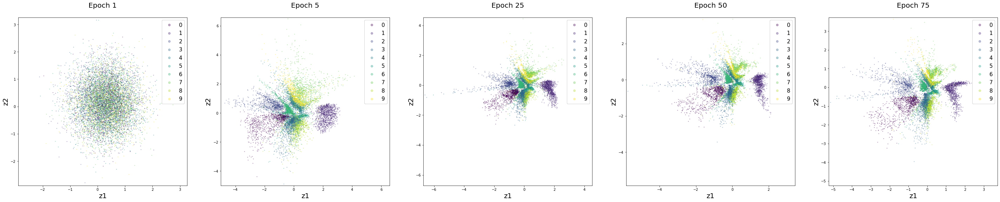

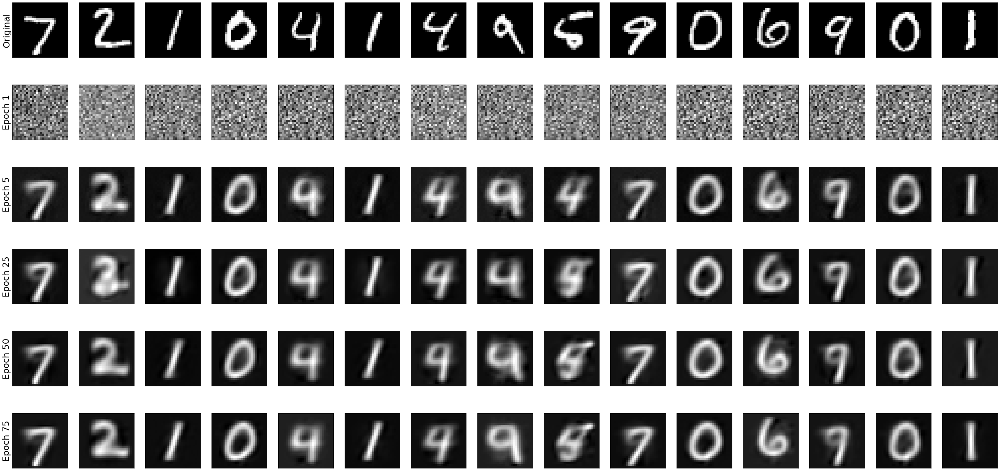

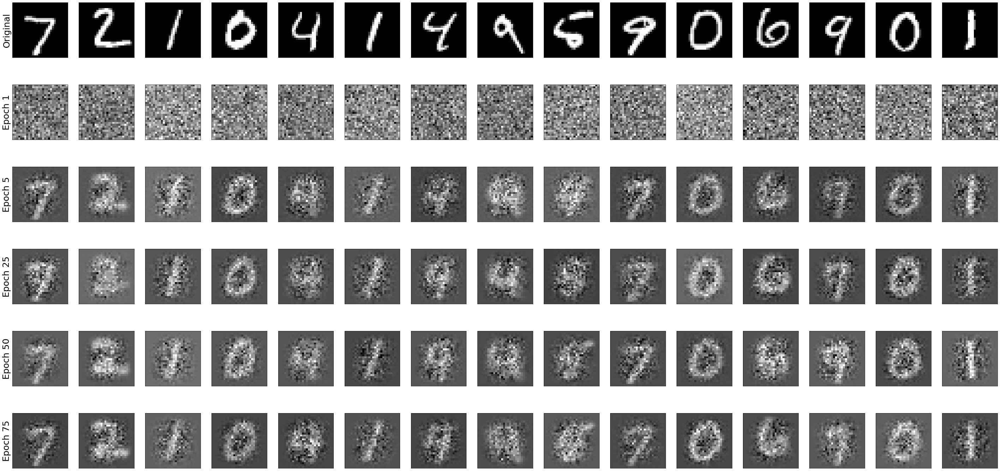

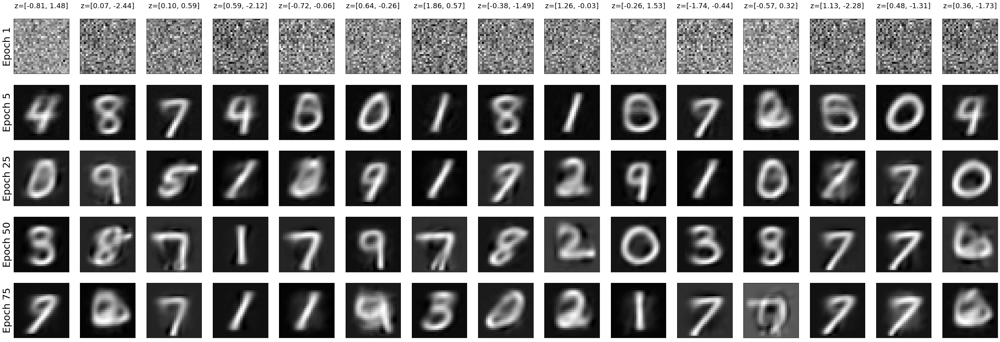

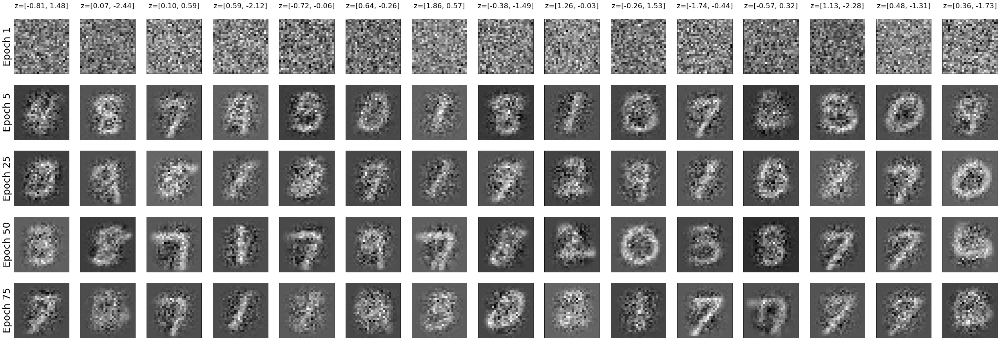

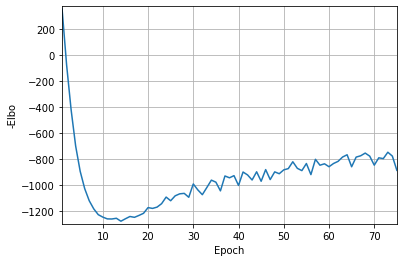

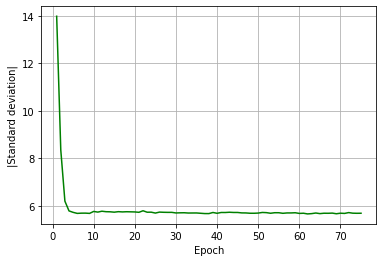

In [5]:
# Create frames for the plots of the reconstructed and generated pictures and latent space representation
fig_l, ax_l = plt.subplots(nrows=1, ncols=5, figsize=(50, 12.5))
fig_rm, ax_rm = plt.subplots(nrows=6, ncols=15, figsize=(50, 25))
fig_rs, ax_rs = plt.subplots(nrows=6, ncols=15, figsize=(50, 25))
fig_gm, ax_gm = plt.subplots(nrows=5, ncols=15, figsize=(45, 15))
fig_gs, ax_gs = plt.subplots(nrows=5, ncols=15, figsize=(45, 15))
# Label axes
ax_rm[0, 0].set_ylabel('Original', fontsize=25)
ax_rs[0, 0].set_ylabel('Original', fontsize=25)
# Plot original pictures of reconstructed samples 
plot_samples(ax_rm[0,:], data_test[0][0:15])
plot_samples(ax_rs[0,:], data_test[0][0:15])

# Set training parameters
batch_size = int(128)
plot_epoch = [1, 5, 25, 50, 75]
epoch_number = 75
# Initialise vectors which store some training data
elbo_history = np.array([0, np.inf])
standard_deviation = []

# Start training
with tf.train.MonitoredSession() as sess:

  # Set latent representation generated from prior as title 
  generated_columns = ['z=['+format(row[0],'.2f')+', '+format(row[1],'.2f')+']\n' for row in sample_prior.eval(session=sess)]
  for axm, axs, col in zip(ax_gm[0], ax_gs[0], generated_columns):
    axm.set_title(col, fontsize=18)
    axs.set_title(col, fontsize=18)

  # Train until the loss does not change remarkeable
  for epoch in range(1,epoch_number+1):
    std = np.linalg.norm(track_std.eval(session=sess))
    standard_deviation = np.append(standard_deviation, np.array([std]))
    # Put normalised test data in a dictionary 
    feed = {data: data_test_norm}
    # Compute the Loss/elbo and the latent code from posterior encoder of the test data and compute the decoded mean (picture) of randomly from the prior sampled latent coordinates   
    test_elbo, test_codes, test_samples_reconstructed_mean, test_samples_reconstructed_sample, test_samples_generated_mean, test_samples_generated_sample = \
    sess.run([elbo, code, samples_reconstructed_mean, samples_reconstructed_sample, samples_generated_mean, samples_generated_sample], feed)
    # Store the history of test loss/elbo
    elbo_history = np.append(elbo_history, np.array([test_elbo]))
    # Print the Epoch and the test loss/elbo
    print('Epoch', epoch, '-elbo', -test_elbo)

    # Plot latent space the 15 generated pictures for epoch 1, 5, 25, 50
    if epoch in plot_epoch:
      # Store the index of the plot
      plot_index = plot_epoch.index(epoch)
      # Set title of code plot
      ax_l[plot_index].set_title('Epoch {}\n'.format(epoch), fontsize=20)
      # Plot the latent representation of the test data and colour them according their label
      plot_codes(ax_l[plot_index], test_codes, data_test[1])
      # Set the axes label of picture plots
      ax_rm[plot_index+1, 0].set_ylabel('Epoch {}'.format(epoch), fontsize=25)
      ax_rs[plot_index+1, 0].set_ylabel('Epoch {}'.format(epoch), fontsize=25)
      ax_gm[plot_index, 0].set_ylabel('Epoch {}'.format(epoch), fontsize=25)
      ax_gs[plot_index, 0].set_ylabel('Epoch {}'.format(epoch), fontsize=25)
      # Plot picture of the reconstructed samples (mean)
      plot_samples(ax_rm[plot_index + 1, :], np.reshape(test_samples_reconstructed_mean, (-1,28,28)))
      # Plot picture of the reconstructed samples (sample)
      plot_samples(ax_rs[plot_index + 1, :], np.reshape(test_samples_reconstructed_sample, (-1,28,28)))
      # Plot picture of the generated samples (mean)
      plot_samples(ax_gm[plot_index, :], np.reshape(test_samples_generated_mean, (-1,28,28)))
      # Plot picture of the generated samples (sample)
      plot_samples(ax_gs[plot_index, :], np.reshape(test_samples_generated_sample, (-1,28,28)))

    # Store the number of training samples (60.000) 
    number_train_data = data_train[0].shape[0]
    # Rondomly sample 60.000 indices
    batch = rd.sample(range(number_train_data), number_train_data)
    # Compute the total number of batches
    batch_number = int(np.floor(number_train_data/batch_size))

    # Go through all batches
    for iter in range(batch_number):
      # Construct the batch as dictionary from the training data 
      feed = {data: data_train_norm[batch[iter*batch_size:((iter+1)*batch_size)-1]]}
      # Compute one update step of the network parameter
      sess.run(optimize, feed)

# Plot -ELBO over epochs 
fig_elbo, ax_elbo = plt.subplots(nrows=1, ncols=1)
ax_elbo.set_xlim(1, 75)
ax_elbo.set_ylim(min(-elbo_history[2:])-20, max(-elbo_history[2:])+20)
ax_elbo.set_xlabel('Epoch')
ax_elbo.set_ylabel('-Elbo')
ax_elbo.grid()
ax_elbo.plot(range(1,epoch_number+1), -elbo_history[2:])
fig_elbo.savefig('elbo.png', dpi=400)
# Save Elbo history for comparison
np.save('Elbo2',elbo_history)

# Plot standard deviation over epoch
fig_std, ax_std = plt.subplots(nrows=1, ncols=1)
ax_std.set_xlabel('Epoch')
ax_std.set_ylabel('|Standard deviation|')
ax_std.grid()
ax_std.plot(range(1,epoch_number+1), standard_deviation, 'g')
fig_std.savefig('std.png', dpi=400)

# Save the figures
fig_l.savefig('latent.png', dpi=400, transparent=True, bbox_inches='tight')
fig_rm.savefig('reconstructed_mean.png', dpi=400, transparent=True, bbox_inches='tight')
fig_rs.savefig('reconstructed_sample.png', dpi=400, transparent=True, bbox_inches='tight')
fig_gm.savefig('generated_mean.png', dpi=400, transparent=True, bbox_inches='tight')
fig_gs.savefig('generated_sample.png', dpi=400, transparent=True, bbox_inches='tight')